<a href="https://colab.research.google.com/github/jfantab/lidar_point_clouds/blob/master/fuse/Pranay_Preprocess.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Installations

In [ ]:
!pip install opencv-python

In [ ]:
!pip3 install torch torchvision torchaudio

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

In [ ]:
!pip install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 34.6 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


#Rest of Program

##Setup

In [ ]:
import os
from glob import glob
import open3d as o3d
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import sys
from google.colab import drive
drive.mount('/content/drive')

%matplotlib inline
plt.rcParams["figure.figsize"] = (20, 10)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!wget https://raw.githubusercontent.com/jfantab/lidar_point_clouds/master/fuse/kitti_utils.py

--2024-05-04 19:20:31--  https://raw.githubusercontent.com/jfantab/lidar_point_clouds/master/fuse/kitti_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9485 (9.3K) [text/plain]
Saving to: ‘kitti_utils.py.1’

kitti_utils.py.1    100%[===================>]   9.26K  --.-KB/s    in 0s      

2024-05-04 19:20:31 (57.8 MB/s) - ‘kitti_utils.py.1’ saved [9485/9485]



In [ ]:
from kitti_utils import *

In [ ]:
## Constants

INDEX = 11
#000008.png
DATE = "2011_09_26"
ID = "0005"
DATA_PATH = f"/content/drive/MyDrive/Colab_Notebooks/{DATE}/{DATE}_drive_{ID}_sync"
CAMERA_CALIB_FILE = f"/content/drive/MyDrive/Colab_Notebooks/{DATE}/calib_cam_to_cam.txt"

# get RGB camera data
left_image_paths = sorted(glob(os.path.join(DATA_PATH, 'image_02/data/*.png')))
right_image_paths = sorted(glob(os.path.join(DATA_PATH, 'image_03/data/*.png')))

# get LiDAR data
bin_paths = sorted(glob(os.path.join(DATA_PATH, 'velodyne_points/data/*.bin')))

oxts_paths = sorted(glob(os.path.join(DATA_PATH, r'oxts/data**/*.txt')))


print(f"Number of left images: {len(left_image_paths)}")
print(f"Number of right images: {len(right_image_paths)}")
print(f"Number of LiDAR point clouds: {len(bin_paths)}")
print(f"Number of GPS/IMU frames: {len(oxts_paths)}")
#print(len(calib))
#print(calib[0])
WIDTH = 1242
HEIGHT = 375

Number of left images: 154
Number of right images: 154
Number of LiDAR point clouds: 154
Number of GPS/IMU frames: 154


In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # or yolov5m, yolov5l, yolov5x, custom
# set confidence and IOU thresholds
model.conf = 0.25  # confidence threshold (0-1), default: 0.25
model.iou = 0.25  # NMS IoU threshold (0-1), default: 0.45

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-5-4 Python-3.10.12 torch-2.2.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


##Read in File

In [ ]:
def read_bin():
    file = bin_paths[INDEX]
    pc_bin = np.fromfile(file, '<f4') # Reading in the coordinates as floats
    pc_bin = pc_bin.reshape((-1, 4))
    pc_bin = pc_bin[:, :3] # Only taking the X, Y, and Z coordinates
    o3d_pcd = o3d.geometry.PointCloud(o3d.utility.Vector3dVector(pc_bin)) # Converting to Open3D point cloud format
    return o3d_pcd

def read_calib():
    with open(CAMERA_CALIB_FILE,'r') as f:
        calib = f.readlines()

    # get projection matrices (rectified left camera --> left camera (u,v,z))
    P_rect2_cam2 = np.array([float(x) for x in calib[25].strip().split(' ')[1:]]).reshape((3,4))

    # get rigid transformation from Camera 0 (ref) to Camera 2
    R_2 = np.array([float(x) for x in calib[21].strip().split(' ')[1:]]).reshape((3,3))
    t_2 = np.array([float(x) for x in calib[22].strip().split(' ')[1:]]).reshape((3,1))

    # get cam0 to cam2 rigid body transformation in homogeneous coordinates
    T_ref0_ref2 = np.insert(np.hstack((R_2, t_2)), 3, values=[0,0,0,1], axis=0)

    return (P_rect2_cam2[:,:3], T_ref0_ref2)

def read_image():
    return left_image_paths[INDEX]

##Load Camera Calibration and GPS/IMU Data

In [ ]:
with open(CAMERA_CALIB_FILE,'r') as f:
    calib = f.readlines()

# get projection matrices (rectified left camera --> left camera (u,v,z))
P_rect2_cam2 = np.array([float(x) for x in calib[25].strip().split(' ')[1:]]).reshape((3,4))


# get rectified rotation matrices (left camera --> rectified left camera)
R_ref0_rect2 = np.array([float(x) for x in calib[24].strip().split(' ')[1:]]).reshape((3, 3,))

# add (0,0,0) translation and convert to homogeneous coordinates
R_ref0_rect2 = np.insert(R_ref0_rect2, 3, values=[0,0,0], axis=0)
R_ref0_rect2 = np.insert(R_ref0_rect2, 3, values=[0,0,0,1], axis=1)


# get rigid transformation from Camera 0 (ref) to Camera 2
R_2 = np.array([float(x) for x in calib[21].strip().split(' ')[1:]]).reshape((3,3))
t_2 = np.array([float(x) for x in calib[22].strip().split(' ')[1:]]).reshape((3,1))

# get cam0 to cam2 rigid body transformation in homogeneous coordinates
T_ref0_ref2 = np.insert(np.hstack((R_2, t_2)), 3, values=[0,0,0,1], axis=0)

CALIB_FILE = f"/content/drive/MyDrive/Colab_Notebooks/{DATE}"
T_velo_ref0 = get_rigid_transformation(os.path.join(CALIB_FILE, 'calib_velo_to_cam.txt'))
T_imu_velo = get_rigid_transformation(os.path.join(CALIB_FILE, 'calib_imu_to_velo.txt'))

# transform from velo (LiDAR) to left color camera (shape 3x4)
T_velo_cam2 = P_rect2_cam2 @ R_ref0_rect2 @ T_ref0_ref2 @ T_velo_ref0

# homogeneous transform from left color camera to velo (LiDAR) (shape: 4x4)
T_cam2_velo = np.linalg.inv(np.insert(T_velo_cam2, 3, values=[0,0,0,1], axis=0))

# transform from IMU to left color camera (shape 3x4)
T_imu_cam2 = T_velo_cam2 @ T_imu_velo

# homogeneous transform from left color camera to IMU (shape: 4x4)
T_cam2_imu = np.linalg.inv(np.insert(T_imu_cam2, 3, values=[0,0,0,1], axis=0))

##Preprocessing

In [ ]:
## Preprocessing
## Reference: https://www.open3d.org/docs/release/tutorial/geometry/pointcloud_outlier_removal.html

def remove_statistical_outliers(points):
    return points.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)

def remove_radius_outliers(points):
    return points.remove_radius_outlier(nb_points=4, radius=0.005)

def uniform_subsample(points, freq):
    return points.uniform_down_sample(every_k_points=freq)

def view_(points, ind):
    inlier_pcd = points.select_by_index(ind)
    outlier_pcd = points.select_by_index(ind, invert=True)

    # outlier_pcd.paint_uniform_color([1, 0, 0])
    # inlier_pcd.paint_uniform_color([0.8, 0.8, 0.8])


    # o3d.visualization.draw_geometries([inlier_pcd])
    return inlier_pcd
def get_uvz_centers(image, velo_uvz, bboxes, draw=True):
    ''' Obtains detected object centers projected to uvz camera coordinates.
        Starts by associating LiDAR uvz coordinates to detected object centers,
        once a match is found, the coordiantes are transformed to the uvz
        camera reference and added to the bboxes array.

        NOTE: The image is modified in place so there is no need to return it.

        Inputs:
          image - input image for detection
          velo_uvz - LiDAR coordinates projected to camera reference
          bboxes - xyxy bounding boxes form detections from yolov5 model output
          draw - (_Bool) draw measured depths on image
        Outputs:
          bboxes_out - modified array containing the object centers projected
                       to uvz image coordinates
        '''

    # unpack LiDAR camera coordinates
    u, v, z = velo_uvz

    # get new output
    bboxes_out = np.zeros((bboxes.shape[0], bboxes.shape[1] + 3))
    bboxes_out[:, :bboxes.shape[1]] = bboxes

    # iterate through all detected bounding boxes
    for i, bbox in enumerate(bboxes):
        pt1 = torch.round(bbox[0:2]).to(torch.int).numpy()
        pt2 = torch.round(bbox[2:4]).to(torch.int).numpy()

        # get center location of the object on the image
        obj_x_center = (pt1[1] + pt2[1]) / 2
        obj_y_center = (pt1[0] + pt2[0]) / 2

        # now get the closest LiDAR points to the center
        center_delta = np.abs(np.array((v, u))
                              - np.array([[obj_x_center, obj_y_center]]).T)

        # choose coordinate pair with the smallest L2 norm
        min_loc = np.argmin(np.linalg.norm(center_delta, axis=0))

        # get LiDAR location in image/camera space
        velo_depth = z[min_loc]; # LiDAR depth in camera space
        uvz_location = np.array([u[min_loc], v[min_loc], velo_depth])

        # add velo projections (u, v, z) to bboxes_out
        bboxes_out[i, -3:] = uvz_location

        # draw depth on image at center of each bounding box
        # This is depth as perceived by the camera
        if draw:
            object_center = (np.round(obj_y_center).astype(int),
                             np.round(obj_x_center).astype(int))
            cv2.putText(image,
                        '{0:.2f} m'.format(velo_depth),
                        object_center, # top left
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, # font scale
                        (255, 0, 0), 2, cv2.LINE_AA)

    return bboxes_out

##Preprocessing - Mine

In [189]:
def filter_lidar_points(lidar_points, bboxes, threshold=1.0):
    filtered_points = []
    for i in range(len(lidar_points)):
      point = lidar_points[i]
      # Check if the point is within any of the bounding boxes
      for bbox in bboxes:
          min_x, min_y, max_x, max_y = bbox[:4]
          if min_x <= point[0] <= max_x and min_y <= point[1] <= max_y:
              filtered_points.append(i)
              break
    return np.array(filtered_points)

def get_detection_coordinates(image, bin_path, draw_boxes=True, draw_depth=True):
    # Compute detections
    detections = model(image)
    if draw_boxes:
        detections.show()

    # Extract bounding boxes
    bboxes = detections.xyxy[0].cpu()

    # Extract LiDAR points and transform them to image/camera space
    velo_uvz = project_velobin2uvz(bin_path, T_velo_cam2, image, remove_plane=True)
    bboxes = get_uvz_centers(image, velo_uvz, bboxes, draw=draw_depth)

    # Extract object centers from the bounding boxes
    object_centers = bboxes[:, -3:]

    # Filter lidar points based on bounding boxes centered on object centers
    lidar_points = velo_uvz[:2].T  # Extract x, y coordinates
    filtered_points_ind = filter_lidar_points(lidar_points, bboxes[:, :4])
    print(lidar_points.shape)
    print(filtered_points_ind.shape)
    y_vals = velo_uvz[2:3].T
    filtered_point_cloud = []
    for i in filtered_points_ind:
      filtered_point_cloud.append([lidar_points[i][0], lidar_points[i][1], y_vals[i][0]])

    #filtered_point_cloud = np.hstack((lidar_points[filtered_points_ind], lidar_points[:, 2][:, np.newaxis][filtered_points_ind]))

    return bboxes, filtered_point_cloud


##Visualization

In [114]:
def show_points(points_og, colors):
  fig = go.Figure(
      data=[
          go.Scatter3d(
              x=points_og[:,0], y=points_og[:,1], z=points_og[:,2],
              mode='markers',
              marker=dict(size=1, color=colors)
          )
      ],
      layout=dict(
          scene=dict(
              xaxis=dict(visible=False),
              yaxis=dict(visible=False),
              zaxis=dict(visible=False)
          )
      )
  )
  fig.update_layout(paper_bgcolor="black")
  fig.update_layout(
      autosize=False,
      width=800,
      height=800,
  )
  fig.show()

##Main

In [193]:
import plotly.graph_objects as go

points_orig = read_bin()
colors = None
if points_orig.has_colors():
    colors = np.asarray(points_orig.colors)
elif points_orig.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(points_orig.normals) * 0.5
else:
    points_orig.paint_uniform_color((1.0, 0.0, 0.0))
    colors = np.asarray(points_orig.colors)

points_temp = np.asarray(points_orig.points)
print(points_temp.shape)
show_points(points_temp, colors)

(123334, 3)


In [161]:
print(points_temp.shape)
print(points_temp[0])
print(T_velo_cam2.shape)

(123334, 3)
[     22.811       0.067        0.98]
(3, 4)


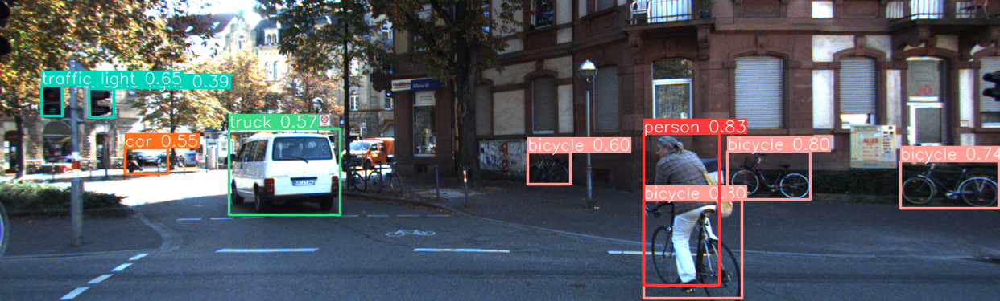

(11512, 2)
(3464,)
[136.06328911292806, 135.7527859039165, 10.24825152807926]


In [190]:
_, ind = remove_statistical_outliers(points_orig)
points_clean_a = view_(points_orig, ind)

left_image = cv2.cvtColor(cv2.imread(left_image_paths[INDEX]), cv2.COLOR_BGR2RGB)
bin_path = bin_paths[INDEX]

#points = filter_important_points(left_image, points_temp)
bboxes, points = get_detection_coordinates(left_image, bin_path)
print(points[0])

In [192]:
show_points(np.array(points), colors)